# Pre-trained models benchmark

In [ ]:
# SOME IMPORTS

import os
import torch
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO

%matplotlib inline

In [2]:
# FUNCTION TO COMPUTE FLOPS, THERE IS AN ALTERNATIVE WITH THOP

def get_flops_with_torch_profiler(model, imgsz=640):
    """Compute model FLOPs (thop alternative)."""
    #model = de_parallel(model) in case of pasing DDP model, it transforms it to a single GPU model
    p = next(model.parameters())
    stride = (max(int(model.stride.max()), 32) if hasattr(model, 'stride') else 32) * 2  # max stride
    im = torch.zeros((1, p.shape[1], stride, stride), device=p.device)  # input image in BCHW format
    with torch.profiler.profile(with_flops=True) as prof:
        model(im)
    flops = sum(x.flops for x in prof.key_averages()) / 1E9
    imgsz = imgsz if isinstance(imgsz, list) else [imgsz, imgsz]  # expand if int/float
    flops = flops * imgsz[0] / stride * imgsz[1] / stride  # 640x640 GFLOPs
    return flops

In [3]:
def perform_benchmark(archs, dataset, devices, formats=['onnx', 'tensorrt'], path='./../../models/'):
    # EMPTY LISTS TO STORE VALUES
    t_pre = []
    t_infer = []
    t_post = []
    maps = []
    params = []
    flops = []

    is_coco = 'coco.yaml' in dataset
    if is_coco:
        maps_small = []

    if 'onnx' in formats:
        o_t_pre = []
        o_t_infer = []
        o_t_post = []
        o_maps = []
        
    if 'tensorrt' in formats:
        r_t_pre = []
        r_t_infer = []
        r_t_post = []
        r_maps = []
    

    # PERFORM BENCHMARK OVER THE LIST OF SPECIFIED MODELS
    for arch in archs:
        # Register model
        model = YOLO(path+arch+'.pt')
        # Evalute in validation dataset
        metrics = model.val(data=dataset, verbose=True, plots=False, save_json=True, cache=True, device=devices)
    
        # Get metrics in *.pt format
        t_pre.append(metrics.speed['preprocess'])
        t_infer.append(metrics.speed['inference'])
        t_post.append(metrics.speed['postprocess'])
        maps.append(metrics.box.map)
        params.append(model.info()[1])
        flops.append(get_flops_with_torch_profiler(model.model, imgsz=640)) # TODO adjust image size for P6 model.
        if is_coco:
            maps_small.append(metrics.box.map_small)
    
        if 'onnx' in formats:
            # Export to ONNX format
            filename = model.export(format='onnx', dynamic=False, half=False, int8=False, simplify=False, opset=None) #TODO: INVESTIGATE
            # Register and Evaluate exported model
            export = YOLO(filename, task=model.task)
            # TODO: changed Dataset bc it is very slow in onnx
            results = export.val(data=dataset, batch=1, plots=False, verbose=False, imgsz=model.overrides['imgsz'], device=devices)
    
            # Get metrics in *.onnx format
            o_t_pre.append(results.speed['preprocess'])
            o_t_infer.append(results.speed['inference'])
            o_t_post.append(results.speed['postprocess'])
            o_maps.append(results.box.map)
        
        if 'tensorrt' in formats:
            # Export to TensorRT
            filename = path+arch+'.engine'
            if not os.path.isfile(filename):
                filename = model.export(format='engine', dynamic=False, half=False, int8=False, simplify=False, workspace=4, device=devices) #TODO: INVESTIGATE
            else:
                print('TensorRT model already exists, loading it ...')
            # Register and Evaluate exported model
            export = YOLO(filename, task=model.task)
            results = export.val(data=dataset, batch=1, plots=False, verbose=False, imgsz=model.overrides['imgsz'], device=devices)
        
            # Get metrics in *.engine format
            r_t_pre.append(results.speed['preprocess'])
            r_t_infer.append(results.speed['inference'])
            r_t_post.append(results.speed['postprocess'])
            r_maps.append(results.box.map)
        

    # BUILD DATAFRAME WITH THE OBTAINED RESULTS
    df = pd.DataFrame({
        'architecture': archs,
        'parameters': params,
        'FLOPs': flops,
        'preprocess': t_pre,
        'inference': t_infer,
        'postprocess': t_post,
        'mAP': maps,
    })
    # COMPUTE FPS USING INFERENCE TIME ONLY
    df['FPS'] = 1000/df.inference

    if is_coco:
        df = df.assign(mAP_small=maps_small)

    if 'onnx' in formats:
        df = df.assign(o_preprocess=o_t_pre, o_inference=o_t_infer, o_postprocess=o_t_post, o_mAP=o_maps)
        df['o_FPS'] = 1000/df.o_inference

    if 'tensorrt' in formats:
        df = df.assign(r_preprocess=r_t_pre, r_inference=r_t_infer, r_postprocess=r_t_post, r_mAP=r_maps)
        df['r_FPS'] = 1000/df.r_inference

    return df


In [4]:
# SETUP DATASET AND DEVICE
path = '/home-net/ierregue/project/detector/small-fast-detector/training_baselines'
archs = ['/8n-300e-64b/weights/best', '/8np2-300e-64b2/weights/best']    
dataset = './../ultralytics/cfg/datasets/coco.yaml'
devices = [6]
formats = ['onnx', 'tensorrt']

In [5]:
new_df = perform_benchmark(archs, dataset, devices, formats, path)

Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients
val: Scanning /data-fast/127-data2/ierregue/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
val: Caching images (4.1GB True): 100%|██████████| 5000/5000 [00:03<00:00, 1542.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:31<00:00,  9.93it/s]
                   all       5000      36335      0.633      0.464      0.514      0.363
                person       5000      10777       0.77      0.653      0.741      0.512
               bicycle       5000        314      0.656      0.385       0.44      0.252
                   car       5000       1918      0.665      0.497      0.556      0.354
            motorcycle       5000        367      0.756      0.559       0.65  

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!
Loading and preparing results...
DONE (t=5.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=54.80s).
Accumulating evaluation results...
DONE (t=50.38s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.519
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.399
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.179
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.400
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.519
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val3
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients
STAGE:2023-08-20 11:32:58 1957325:1957325 ActivityProfilerController.cpp:311] Completed Stage: Warm Up
STAGE:2023-08-20 11:32:58 1957325:1957325 ActivityProfilerController.cpp:317] Completed Stage: Collection
STAGE:2023-08-20 11:32:58 1957325:1957325 ActivityProfilerController.cpp:321] Completed Stage: Post Processing
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CPU (AMD EPYC 7452 32-Core Processor)

PyTorch: starting from '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (6.2 MB)

ONNX: starting export with onnx 1.14.0 opset 17...


============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



ONNX: export success ✅ 1.2s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx' (12.2 MB)

Export complete (3.8s)
Results saved to /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights
Predict:         yolo predict task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx imgsz=640 data=None 
Visualize:       https://netron.app
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
Loading /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx for ONNX Runtime inference...
Forcing batch=1 square inference (1,3,640,640) for non-PyTorch models
val: Scanning /data-fast

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!
Loading and preparing results...
DONE (t=6.40s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=54.18s).
Accumulating evaluation results...
DONE (t=37.42s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.518
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.401
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.522
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.532
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val4
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)

PyTorch: starting from '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (6.2 MB)
requirements: Ultralytics requirement ['onnxruntime-gpu'] not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)

ONNX: starting export with onnx 1.14.0 opset 17...


============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



ONNX: simplifying with onnxsim 0.4.33...
ONNX: export success ✅ 9.0s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx' (12.2 MB)

TensorRT: starting export with TensorRT 8.6.1...
TensorRT: input "images" with shape(1, 3, 640, 640) DataType.FLOAT
TensorRT: output "output0" with shape(1, 84, 8400) DataType.FLOAT
TensorRT: building FP32 engine as /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.engine


[08/20/2023-11:55:44] [TRT] [I] [MemUsageChange] Init CUDA: CPU +623, GPU +0, now: CPU 12453, GPU 2543 (MiB)
[08/20/2023-11:55:46] [TRT] [V] Trying to load shared library libnvinfer_builder_resource.so.8.6.1
[08/20/2023-11:55:46] [TRT] [V] Loaded shared library libnvinfer_builder_resource.so.8.6.1
[08/20/2023-11:56:12] [TRT] [I] [MemUsageChange] Init builder kernel library: CPU +1723, GPU +270, now: CPU 14252, GPU 2813 (MiB)
[08/20/2023-11:56:12] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
[08/20/2023-11:56:12] [TRT] [I] ----------------------------------------------------------------
[08/20/2023-11:56:12] [TRT] [I] Input filename:   /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.onnx
[08/20/2023-11:56:12] [TRT] [I]

TensorRT: export success ✅ 157.1s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.engine' (19.3 MB)

Export complete (157.2s)
Results saved to /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights
Predict:         yolo predict task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.engine imgsz=640 
Validate:        yolo val task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.engine imgsz=640 data=None 
Visualize:       https://netron.app
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
Loading /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8n-300e-64b/weights/best.engine for TensorRT inference...


[08/20/2023-11:58:06] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[08/20/2023-11:58:06] [TRT] [I] Loaded engine size: 19 MiB
[08/20/2023-11:58:07] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +16, now: CPU 2, GPU 33 (MiB)
[08/20/2023-11:58:07] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +17, now: CPU 2, GPU 50 (MiB)
[08/20/2023-11:58:07] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading


val: Scanning /data-fast/127-data2/ierregue/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5000/5000 [01:23<00:00, 59.97it/s]
                   all       5000      36335      0.632      0.465      0.513      0.363
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Saving /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val5/predictions.json...

Evaluating pycocotools mAP using /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val5/predictions.json and /data-fast/127-data2/ierregue/datasets/coco/annotations/instances_val2017.json...


loading annotations into memory...
Done (t=0.39s)
creating index...
index created!
Loading and preparing results...
DONE (t=6.52s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=55.67s).
Accumulating evaluation results...
DONE (t=14.71s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.518
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.401
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.522
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.532
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val5
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
YOLOv8n-p2 summary (fused): 207 layers, 3348240 parameters, 0 gradients
val: Scanning /data-fast/127-data2/ierregue/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
val: Caching images (4.1GB True): 100%|██████████| 5000/5000 [00:03<00:00, 1484.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:44<00:00,  7.06it/s]
                   all       5000      36335      0.636      0.483      0.528      0.377
                person       5000      10777      0.766      0.682       0.76       0.53
               bicycle       5000        314      0.673      0.367      0.454       0.27
                   car       5000       1918      0.668       0.54      0.5

loading annotations into memory...
Done (t=0.56s)
creating index...
index created!
Loading and preparing results...
DONE (t=8.46s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=56.88s).
Accumulating evaluation results...
DONE (t=11.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.380
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.535
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.413
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.527
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.547
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val6
YOLOv8n-p2 summary (fused): 207 layers, 3348240 parameters, 0 gradients
STAGE:2023-08-20 12:03:51 1957325:1957325 ActivityProfilerController.cpp:311] Completed Stage: Warm Up
STAGE:2023-08-20 12:03:51 1957325:1957325 ActivityProfilerController.cpp:317] Completed Stage: Collection
STAGE:2023-08-20 12:03:51 1957325:1957325 ActivityProfilerController.cpp:321] Completed Stage: Post Processing
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CPU (AMD EPYC 7452 32-Core Processor)

PyTorch: starting from '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 34000) (6.7 MB)

ONNX: starting export with onnx 1.14.0 opset 17...


============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



ONNX: export success ✅ 1.7s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.onnx' (13.5 MB)

Export complete (4.9s)
Results saved to /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights
Predict:         yolo predict task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.onnx imgsz=640 data=None 
Visualize:       https://netron.app
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
Loading /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.onnx for ONNX Runtime inference...
Forcing batch=1 square inference (1,3,640,640) for non-PyTorch models
val: Scan

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!
Loading and preparing results...
DONE (t=8.59s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=57.39s).
Accumulating evaluation results...
DONE (t=11.75s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.381
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.537
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.320
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.547
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val7
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)

PyTorch: starting from '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 34000) (6.7 MB)
requirements: Ultralytics requirement ['onnxruntime-gpu'] not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)

ONNX: starting export with onnx 1.14.0 opset 17...
ONNX: simplifying with onnxsim 0.4.33...


============= Diagnostic Run torch.onnx.export version 2.0.1+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================



ONNX: export success ✅ 9.5s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.onnx' (13.2 MB)

TensorRT: starting export with TensorRT 8.6.1...
TensorRT: input "images" with shape(1, 3, 640, 640) DataType.FLOAT
TensorRT: output "output0" with shape(1, 84, 34000) DataType.FLOAT
TensorRT: building FP32 engine as /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.engine


[08/20/2023-12:39:17] [TRT] [I] The logger passed into createInferBuilder differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[08/20/2023-12:39:17] [TRT] [I] [MemUsageChange] Init CUDA: CPU +0, GPU +0, now: CPU 12826, GPU 5731 (MiB)
[08/20/2023-12:39:17] [TRT] [V] Trying to load shared library libnvinfer_builder_resource.so.8.6.1
[08/20/2023-12:39:17] [TRT] [V] Loaded shared library libnvinfer_builder_resource.so.8.6.1
[08/20/2023-12:39:23] [TRT] [I] [MemUsageChange] Init builder kernel library: CPU +1720, GPU +262, now: CPU 14546, GPU 5993 (MiB)
[08/20/2023-12:39:23] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
[08/20/2023-12:39:23] [TRT] [I] ----

TensorRT: export success ✅ 80.0s, saved as '/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.engine' (21.8 MB)

Export complete (80.0s)
Results saved to /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights
Predict:         yolo predict task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.engine imgsz=640 
Validate:        yolo val task=detect model=/home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.engine imgsz=640 data=None 
Visualize:       https://netron.app
Ultralytics YOLOv8.0.145 🚀 Python-3.8.10 torch-2.0.1+cu117 CUDA:6 (NVIDIA GeForce RTX 3090, 24260MiB)
Loading /home-net/ierregue/project/detector/small-fast-detector/training_baselines/8np2-300e-64b2/weights/best.engine for TensorRT inference...


[08/20/2023-12:40:27] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[08/20/2023-12:40:27] [TRT] [I] Loaded engine size: 21 MiB
[08/20/2023-12:40:27] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +18, now: CPU 0, GPU 51 (MiB)
[08/20/2023-12:40:27] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +1, GPU +47, now: CPU 1, GPU 98 (MiB)
[08/20/2023-12:40:27] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading


val: Scanning /data-fast/127-data2/ierregue/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5000/5000 [01:23<00:00, 59.65it/s]
                   all       5000      36335      0.634      0.487       0.53      0.378
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Saving /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val8/predictions.json...

Evaluating pycocotools mAP using /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val8/predictions.json and /data-fast/127-data2/ierregue/datasets/coco/annotations/instances_val2017.json...


loading annotations into memory...
Done (t=0.39s)
creating index...
index created!
Loading and preparing results...
DONE (t=7.40s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=62.08s).
Accumulating evaluation results...
DONE (t=38.86s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.381
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.537
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.547
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to /home-net/ierregue/project/detector/small-fast-detector/runs/detect/val8


In [6]:
new_df

,architecture,parameters,FLOPs,preprocess,inference,postprocess,mAP,FPS,mAP_small,o_preprocess,o_inference,o_postprocess,o_mAP,o_FPS,r_preprocess,r_inference,r_postprocess,r_mAP,r_FPS
0,/8n-300e-64b/weights/best,3151904,8.745132,0.074558,1.293583,0.527176,0.363139,773.046611,0.179169,0.747261,196.108538,26.469252,0.362720,5.099217,0.206274,1.579904,1.166503,0.362726,632.949837
1,/8np2-300e-64b2/weights/best,3348240,17.228976,0.077903,1.752739,1.167157,0.377121,570.535726,0.200819,0.516333,350.583914,28.474758,0.377719,2.852384,0.217506,2.386452,1.344322,0.377740,419.032127


In [7]:
new_df.to_pickle('xps.pkl')

In [ ]:
load = pd.load

In [21]:
def plot_benchmark(df, save=False):
    # PLOT DF
    markers = ["d", "v", "s", "^", "*", 'x', 'h', 'p', '8', '<', '>']
    plt.rcParams["figure.figsize"] = (12,10)
    plt.rcParams['axes.grid'] = True
    
    f = plt.figure()
    f, axes = plt.subplots(nrows = 3, ncols = 3, sharex=False, sharey=False)
    f.tight_layout(pad=3.0)
    
    for index, row in df.iterrows():
    
        # ROW 0: Parameters, Parameters(mAP_small), FLOPs
        axes[0][0].scatter(row.parameters/10**6, row.mAP, marker=markers[index], label=row.architecture)
        axes[0][0].set_xlabel('Parameters (M)')
        axes[0][0].set_ylabel(r'COCO mAP$^{50-90}_{val}$')

        if 'mAP_small' in df.columns:
            axes[0][1].scatter(row.FPS, row.mAP_small, marker=markers[index])
            axes[0][1].set_xlabel('FPS in PyTorch format')
            axes[0][1].set_ylabel(r'COCO mAP$^{50-90}_{val}$ (Small Objects)')
    
        axes[0][2].scatter(row.FLOPs, row.mAP, marker=markers[index])
        axes[0][2].set_xlabel('FLOPs (B)')
        axes[0][2].set_ylabel(r'COCO mAP$^{50-90}_{val}$')
        
        # PyTorch format
        axes[1][0].scatter(row.FPS, row.mAP, marker=markers[index])
        axes[1][0].set_xlabel('FPS in PyTorch format')
        axes[1][0].set_ylabel(r'COCO mAP$^{50-90}_{val}$')

        axes[2][0].scatter(row.inference, row.mAP, marker=markers[index])
        axes[2][0].set_xlabel('Latency (ms/img) in PyTorch format')
        axes[2][0].set_ylabel(r'COCO mAP$^{50-90}_{val}$')
        
        
        # TensorRT format:
        if 'r_mAP' in df.columns:
            axes[1][1].scatter(row.r_FPS, row.r_mAP, marker=markers[index])
            axes[1][1].set_xlabel('FPS in TensorRT format')
            axes[1][1].set_ylabel(r'COCO mAP$^{50-90}_{val}$')
    
            axes[2][1].scatter(row.r_inference, row.r_mAP, marker=markers[index])
            axes[2][1].set_xlabel('Latency (ms/img) in TensorRT format')
            axes[2][1].set_ylabel(r'COCO mAP$^{50-90}_{val}$')

        
        # ONNX format: 
        if 'o_mAP' in df.columns:
            axes[1][2].scatter(row.o_FPS, row.o_mAP, marker=markers[index])
            axes[1][2].set_xlabel('FPS in ONNX format')
            axes[1][2].set_ylabel(r'COCO mAP$^{50-90}_{val}$')
    
            axes[2][2].scatter(row.o_inference, row.o_mAP, marker=markers[index])
            axes[2][2].set_xlabel('Latency (ms/img) in ONNX format')
            axes[2][2].set_ylabel(r'COCO mAP$^{50-90}_{val}$')
    
    axes[0][0].legend()
    if save:
        plt.savefig('benchmark_plot.png', dpi=f.dpi, bbox_inches='tight')
        
    plt.show()        

In [23]:
loaded_df = pd.read_pickle('benchmark_data.pkl')

In [24]:
loaded_df

,architecture,parameters,FLOPs,preprocess,o_preprocess,r_preprocess,inference,o_inference,r_inference,postprocess,o_postprocess,r_postprocess,mAP,o_mAP,r_mAP,mAP_small,FPS,o_FPS,r_FPS
0,yolov8n,3151904,8.745132,0.099833,0.551753,0.746117,1.328333,150.184353,1.507039,1.155087,19.534074,1.855726,0.370955,0.370352,0.370471,0.186088,752.823169,6.658483,663.552741
1,yolov8s,11156544,28.604844,0.117444,0.537907,0.706413,2.370323,250.200391,2.995207,1.457888,19.061496,1.827719,0.447327,0.447152,0.447121,0.257299,421.883458,3.996796,333.866770
2,yolov8m,25886080,78.943174,0.104205,0.547083,0.709417,5.121535,381.890355,5.826968,1.565579,19.419371,1.963111,0.501147,0.499918,0.499969,0.320782,195.253961,2.618553,171.615839
3,yolov5nu,2649200,7.726150,0.111126,0.718659,0.750400,1.076234,150.693339,1.680386,1.455112,20.195054,1.924909,0.340723,0.339954,0.340020,0.166758,929.165874,6.635993,595.101526
4,yolov5su,9142496,23.997868,0.106943,0.556217,0.756485,1.893267,215.260921,2.300466,1.530116,19.979842,2.040146,0.428533,0.426629,0.426698,0.245235,528.187529,4.645525,434.694605
5,yolov5mu,25091536,64.213011,0.102993,0.626117,0.789804,4.018801,353.119822,4.995182,1.228965,20.687222,2.125826,0.488575,0.486351,0.486315,0.310220,248.830460,2.831900,200.192895
6,yolov5n6u_hd,4326688,7.838086,0.304409,0.631842,1.222945,4.344170,423.864512,3.905530,1.654128,21.761434,2.676590,0.417358,0.417456,0.417463,0.260119,230.193590,2.359244,256.047184
7,yolov5s6u_hd,15293680,24.401337,0.248028,0.896618,0.572493,7.528588,666.990827,6.702432,0.820832,18.722436,1.467885,0.484442,0.483485,0.483446,0.329810,132.827030,1.499271,149.199573


In [17]:
#loaded_df.at[6, 'architecture']='yolov5n6u_hd'

In [22]:
#loaded.append(new_df)

In [19]:
#loaded_df.to_pickle('benchmark_data.pkl')

<Figure size 1200x1000 with 0 Axes>

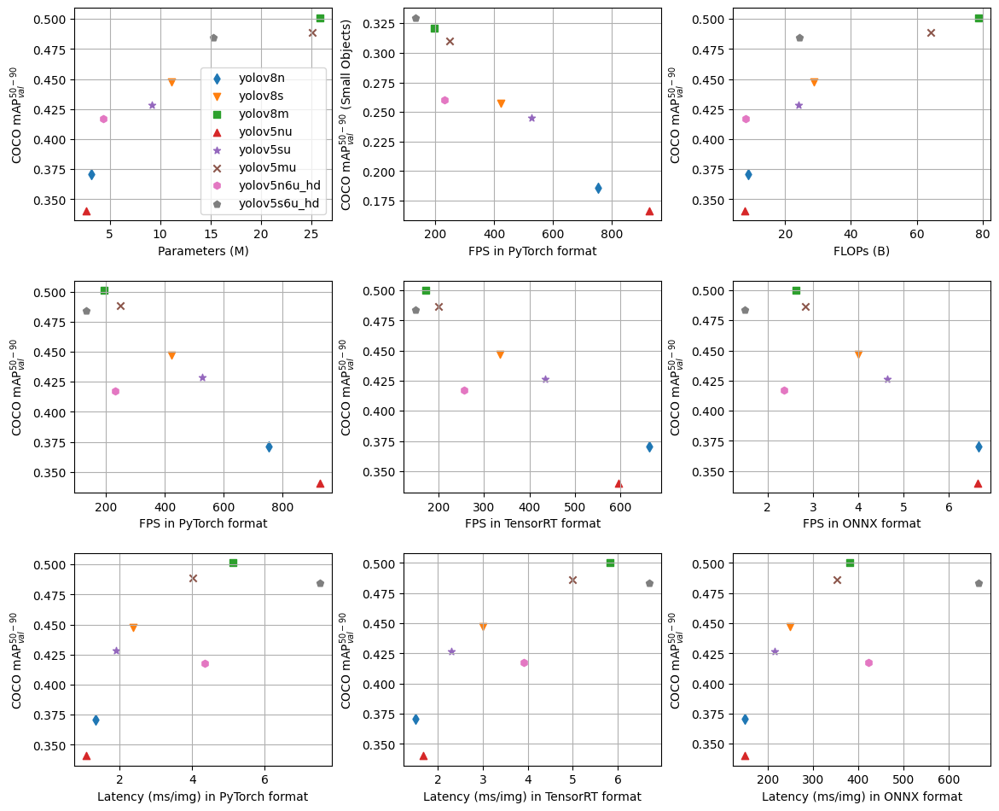

In [22]:
plot_benchmark(loaded_df, save=True)